# Multimodal RAG with Unstructured.io and Gemini

### Installing Dependencies

In [57]:
# Run these bash commands in terminal
# sudo apt-get update
# sudo apt-get install poppler-utils
# sudo apt install tesseract-ocr 
# sudo apt install libtesseract-dev

In [1]:
import PIL
import math
import textwrap
import os
import base64
import time
import getpass
from tqdm import tqdm
import sys
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

from unstructured.partition.pdf import partition_pdf
from unstructured.documents.elements import Image
from unstructured.documents.elements import NarrativeText, Table, Title
from unstructured.documents.elements import *

import google.generativeai as genai

from langchain_google_genai import ChatGoogleGenerativeAI
from langchain_core.prompts import ChatPromptTemplate

import weaviate
from weaviate.classes.init import Auth
import weaviate.classes.config as wc
import weaviate.classes.query as wq
from weaviate.util import generate_uuid5

import warnings
warnings.filterwarnings(action="ignore", category=ResourceWarning)
warnings.filterwarnings(action="ignore", category=UserWarning)

os.environ["GOOGLE_API_KEY"] = getpass.getpass("Enter your Google AI API key: ")

%matplotlib inline

/home/jaykumaran/miniconda3/envs/HuggingFace/lib/python3.10/site-packages/google/protobuf/runtime_version.py:112: UserWarning: Protobuf gencode version 5.27.2 is older than the runtime version 5.28.0 at grpc_health/v1/health.proto. Please avoid checked-in Protobuf gencode that can be obsolete.
  warnings.warn(


## Get Pdf elements with Unstructured

In [2]:
def extract_raw_data_and_paths_from_directory(directory_path):
    all_raw_data = []
    all_file_paths = []

    # List all PDF files in the directory
    pdf_files = [f for f in os.listdir(directory_path) if f.endswith(".pdf")]
    
    # Loop through all PDF files with a progress bar
    for pdf_file in tqdm(pdf_files, desc="Processing PDFs"):
        fin_report_path = os.path.join(directory_path, pdf_file)

        try:
            # Partition the PDF to extract raw data
            fin_report_raw_data = partition_pdf(
                filename=fin_report_path,
                strategy="hi_res",  # save high res images
                extract_images_in_pdf=True,
                extract_image_block_output_dir="data/images",
                starting_page_number=0,
                infer_table_structure=True,  # to preserve table structure
                chunking_strategy=None
            )
            
            # Ensure the extracted elements have page number metadata
            for element in fin_report_raw_data:
                if not hasattr(element.metadata, 'page_number'):
                    print(f"Skipping element without page number in {pdf_file}")
                    continue

            # Append raw data and corresponding file path separately
            all_raw_data.append(fin_report_raw_data)
            all_file_paths.append(fin_report_path)

        except AssertionError as e:
            print(f"Error processing {pdf_file}: {e}")
            continue  # Skip the problematic PDF and move on to the next one
    
    return all_raw_data, all_file_paths


directory_path = "pdfs-financial"
all_extracted_raw_data, all_extracted_file_paths = extract_raw_data_and_paths_from_directory(directory_path)


Processing PDFs:   0%|                                                        | 0/6 [00:00<?, ?it/s]

*************** EP Error ***************
EP Error /onnxruntime_src/onnxruntime/python/onnxruntime_pybind_state.cc:490 void onnxruntime::python::RegisterTensorRTPluginsAsCustomOps(PySessionOptions&, const onnxruntime::ProviderOptions&) Please install TensorRT libraries as mentioned in the GPU requirements page, make sure they're in the PATH or LD_LIBRARY_PATH, and that your GPU is supported.
 when using ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']
Falling back to ['CUDAExecutionProvider', 'CPUExecutionProvider'] and retrying.
****************************************


Some weights of the model checkpoint at microsoft/table-transformer-structure-recognition were not used when initializing TableTransformerForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Processing PDFs:  17%|████████                                        | 1/6 [00:48<04:03, 48.71s/it]

Error processing NVIDIA-2024-Annual-Report.pdf: 


Processing PDFs: 100%|███████████████████████████████████████████████| 6/6 [10:18<00:00, 103.10s/it]


### Check the types of extracted pdf elements 

In [4]:
unique_element_types = set()

for fin_report in all_extracted_raw_data:
    for element in fin_report:
        unique_element_types.add(type(element).__name__)

unique_element_types

{'FigureCaption',
 'Footer',
 'Formula',
 'Header',
 'Image',
 'ListItem',
 'NarrativeText',
 'Table',
 'Text',
 'Title'}

### Check Image data and its associated elements in same page number

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 6
Associated Elements:

--- Titles ---
- <Title>Current Installed Annual Vehicle Capacity</Title>
- <Title>as</Title>
- <Title>Europe: Berlin-Brandenburg</Title>
- <Title>China: Shanghai</Title>
- <Title>US: California, Nevada and Texas</Title>

--- Headers ---
- <Header>VEHICLE CAPACITY</Header>

--- Narrative_texts ---
- <NarrativeText>—ws/Canada —Europe —China</NarrativeText>
- <NarrativeText>In Q2, Gigafactory Berlin-Brandenburg began producing vehicles for right-hand drive markets and delivered its first units to the U.K. We also began delivering vehicles to Qatar, while increasing deliveries to Israel and Taiwan. Our regional production strategy provides flexibility needs change across markets.</NarrativeText>
- <NarrativeText>We significantly increased deliveries in several markets supplied by Gigafactory Shanghai in Q2, including South Korea. While the automotive market in China remains among the most competitive globa

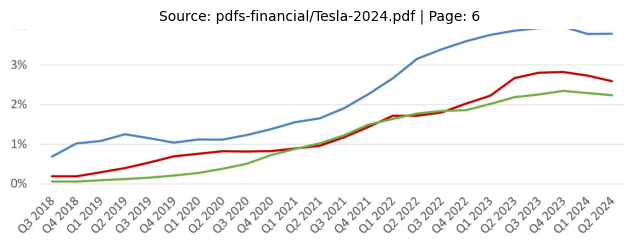

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 7
Associated Elements:

--- Titles ---
- <Title>Battery, Powertrain and Manufacturing</Title>
- <Title>Vehicle and Other Software</Title>
- <Title>In</Title>
- <Title>Artificial Intelligence Software and Hardware</Title>

--- Headers ---
- <Header>CORE TECHNOLOGY</Header>

--- Narrative_texts ---
- <NarrativeText>| | In Q2, we produced over 50% more 4680 cells than in Q1 and continued to see cost improvements. In July, we entered validation of vehicle testing for our first prototype Cybertruck produced with in-house dry cathode 4680 cells — a major cost reduction milestone once ramped. Cost reduction across our product lineup remains a top priority.</NarrativeText>
- <NarrativeText>We continue to release software optimizations that enable an increasingly better experience for y customers. The Spring Release included an immersive full-screen vehicle controls view when parked, large playback controls and quick access to Recents,

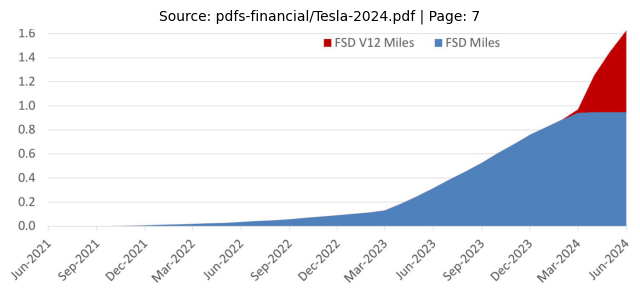

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 7
Associated Elements:

--- Titles ---
- <Title>Battery, Powertrain and Manufacturing</Title>
- <Title>Vehicle and Other Software</Title>
- <Title>In</Title>
- <Title>Artificial Intelligence Software and Hardware</Title>

--- Headers ---
- <Header>CORE TECHNOLOGY</Header>

--- Captions ---
- <FigureCaption>Cumulative miles driven with FSD (Supervised) (billions)</FigureCaption>

--- Narrative_texts ---
- <NarrativeText>| | In Q2, we produced over 50% more 4680 cells than in Q1 and continued to see cost improvements. In July, we entered validation of vehicle testing for our first prototype Cybertruck produced with in-house dry cathode 4680 cells — a major cost reduction milestone once ramped. Cost reduction across our product lineup remains a top priority.</NarrativeText>
- <NarrativeText>We continue to release software optimizations that enable an increasingly better experience for y customers. The Spring Release included an i

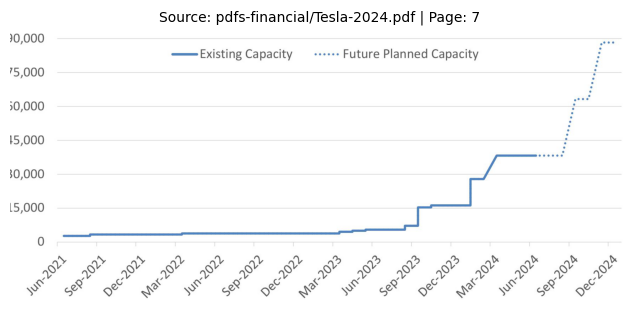

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 11
Associated Elements:

--- Titles ---
- <Title>Global BEV market share* (12-months trailing)</Title>

--- Headers ---
- <Header>ELECTRIC VEHICLE ADOPTION RATE - RETURNED TO GROWTH IN Q2</Header>
---


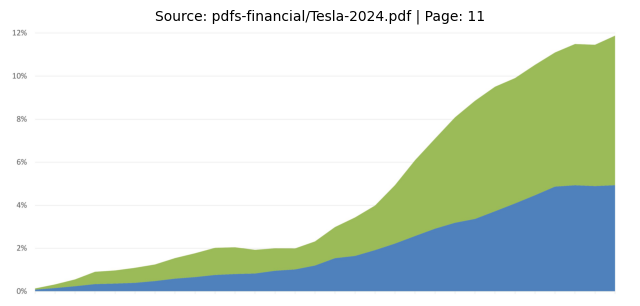

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 12
Associated Elements:

--- Headers ---
- <Header>GIGAFACTORY TEXAS - SOUTH EXPANSION DATA CENTER</Header>
---


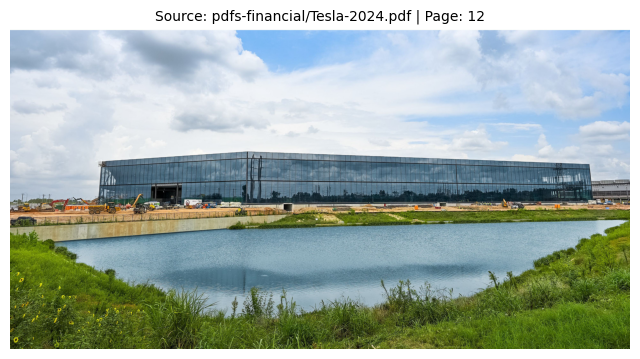

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 13
Associated Elements:

--- Headers ---
- <Header>CORPUS CHRISTI LITHIUM REFINERY - START OF PRODUCTION IN 2025</Header>
---


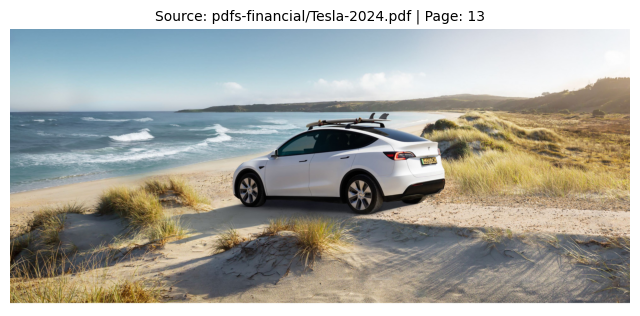

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 14
Associated Elements:

--- Headers ---
- <Header>' =< O = ce - ce Lud co > O</Header>
---


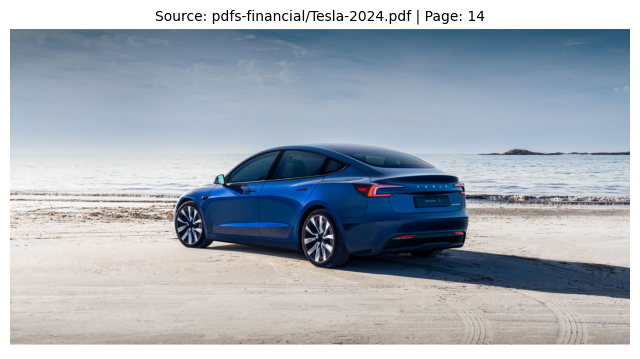

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 15
Associated Elements:

--- Headers ---
- <Header>MODEL Y IN QUICKSILVER -</Header>
---


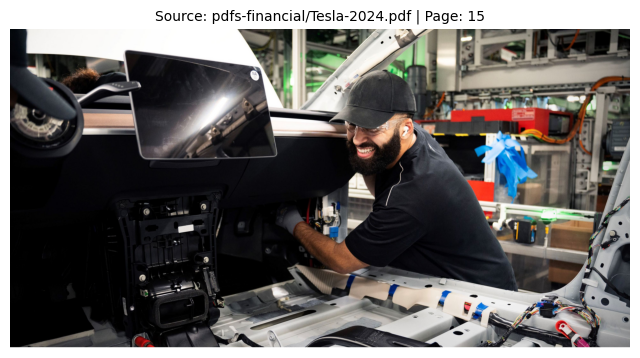

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 16
Associated Elements:

--- Headers ---
- <Header>LUNAR SILVER - NOW AVAILABLE FOR MODEL S AND MODEL X</Header>
---


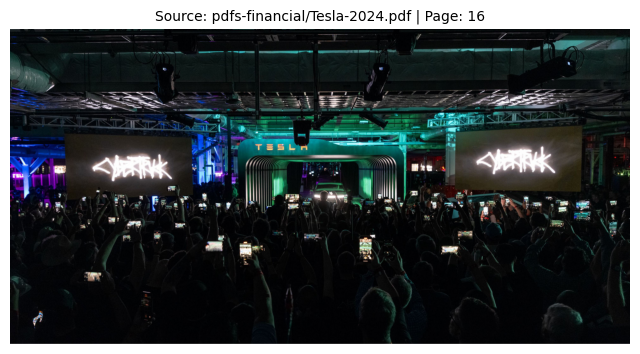

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 17
Associated Elements:

--- Headers ---
- <Header>MEGAPACK - PLUS POWER’S 1 GWH SIERRA ESTRELLA SITE</Header>
---


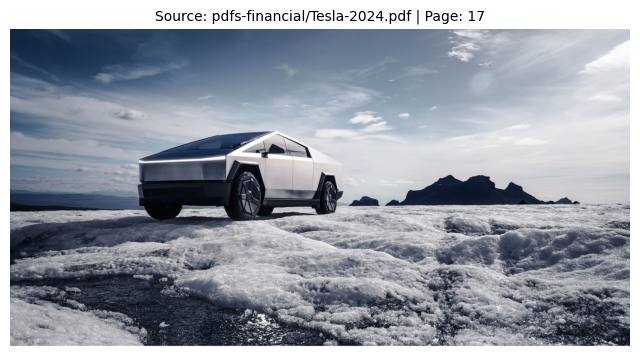

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 18
Associated Elements:
---


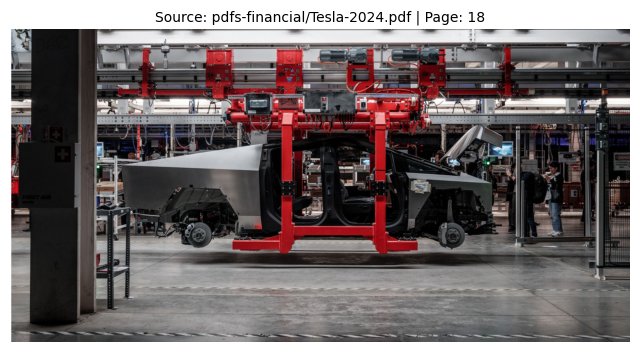

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 19
Associated Elements:

--- Headers ---
- <Header>KEY METRICS QUARTERLY (Unaudited)</Header>

--- Footers ---
- <Footer>20</Footer>
---


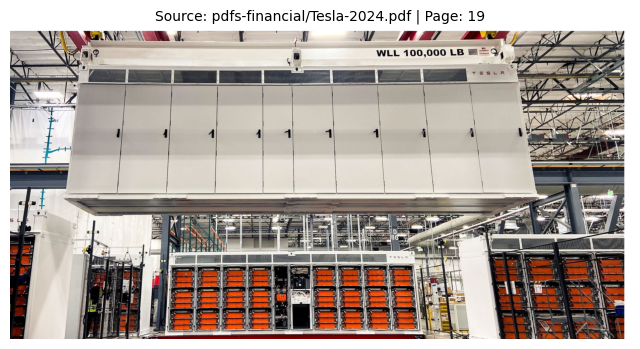

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 19
Associated Elements:

--- Headers ---
- <Header>KEY METRICS QUARTERLY (Unaudited)</Header>

--- Footers ---
- <Footer>20</Footer>

--- Captions ---
- <FigureCaption>Vehicle Deliveries (millions of units)</FigureCaption>

--- Texts ---
- <Text>0</Text>
- <Text>1</Text>
- <Text>2</Text>
- <Text>3</Text>
- <Text>4</Text>
- <Text>5</Text>
- <Text>6</Text>
- <Text>0.0</Text>
- <Text>0.</Text>
- <Text>0.2</Text>
- <Text>0.3</Text>
- <Text>0.4</Text>
- <Text>0.5</Text>
---


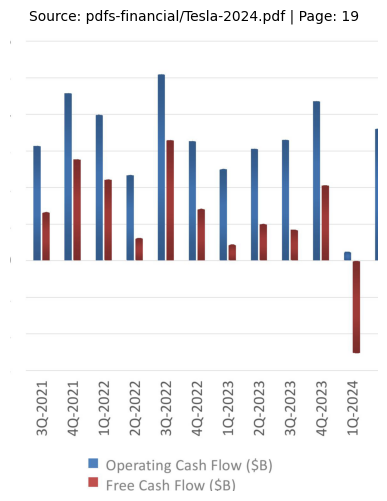

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 19
Associated Elements:

--- Titles ---
- <Title>vZ0C-0Z</Title>

--- Headers ---
- <Header>KEY METRICS QUARTERLY (Unaudited)</Header>

--- Footers ---
- <Footer>20</Footer>

--- Captions ---
- <FigureCaption>Vehicle Deliveries (millions of units)</FigureCaption>

--- Texts ---
- <Text>0</Text>
- <Text>1</Text>
- <Text>2</Text>
- <Text>3</Text>
- <Text>4</Text>
- <Text>5</Text>
- <Text>6</Text>
- <Text>0.0</Text>
- <Text>0.</Text>
- <Text>0.2</Text>
- <Text>0.3</Text>
- <Text>0.4</Text>
- <Text>0.5</Text>
---


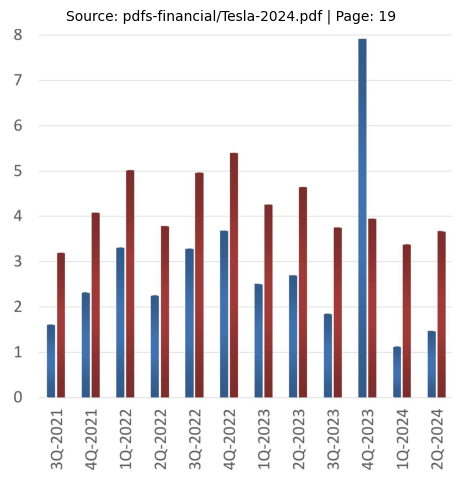

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 20
Associated Elements:

--- Headers ---
- <Header>KEY METRICS TRAILING 12 MONTHS (TTM) (Unaudited)</Header>

--- Footers ---
- <Footer>21</Footer>

--- Texts ---
- <Text>2.0</Text>
---


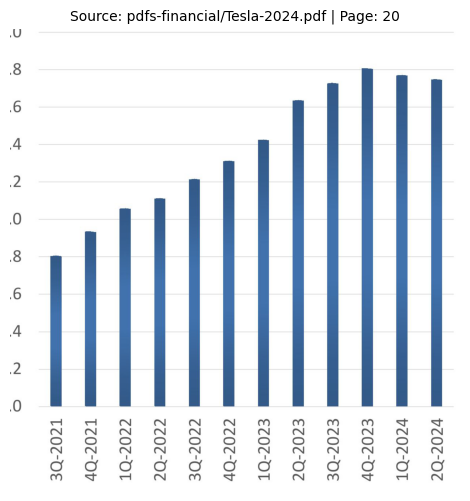

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 20
Associated Elements:

--- Headers ---
- <Header>KEY METRICS TRAILING 12 MONTHS (TTM) (Unaudited)</Header>

--- Footers ---
- <Footer>21</Footer>

--- Captions ---
- <FigureCaption>Vehicle Deliveries (millions of units)</FigureCaption>

--- Texts ---
- <Text>0</Text>
- <Text>2</Text>
- <Text>4</Text>
- <Text>6</Text>
- <Text>8</Text>
- <Text>10</Text>
- <Text>12</Text>
- <Text>14</Text>
- <Text>16</Text>
- <Text>18</Text>
- <Text>20</Text>
- <Text>2.0</Text>
---


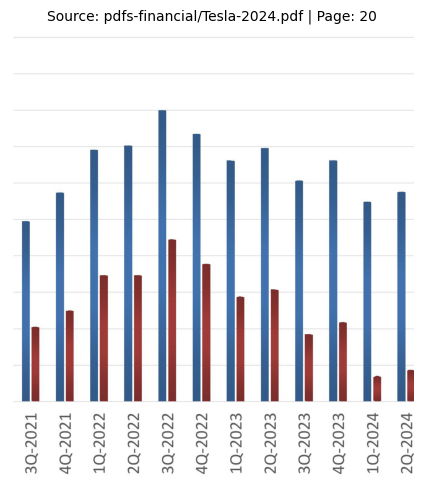

Source document: pdfs-financial/Tesla-2024.pdf
Page number: 20
Associated Elements:

--- Headers ---
- <Header>KEY METRICS TRAILING 12 MONTHS (TTM) (Unaudited)</Header>

--- Footers ---
- <Footer>21</Footer>

--- Captions ---
- <FigureCaption>M Operating Cash Flow (SB) M@ Free Cash Flow (SB)</FigureCaption>
- <FigureCaption>Vehicle Deliveries (millions of units)</FigureCaption>

--- Texts ---
- <Text>20</Text>
- <Text>0</Text>
- <Text>2</Text>
- <Text>4</Text>
- <Text>6</Text>
- <Text>8</Text>
- <Text>10</Text>
- <Text>12</Text>
- <Text>14</Text>
- <Text>16</Text>
- <Text>18</Text>
- <Text>20</Text>
- <Text>2.0</Text>
---


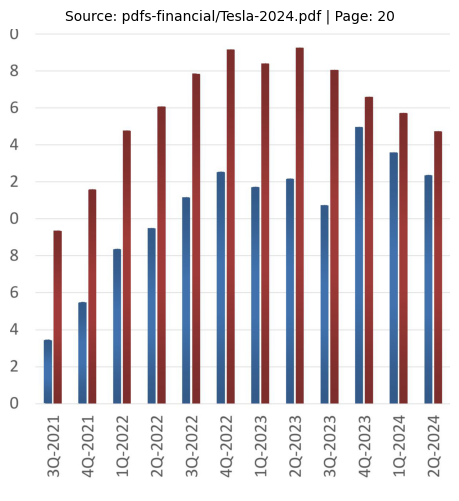

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 8
Associated Elements:

--- Titles ---
- <Title>Europe: Berlin-Brandenburg</Title>
- <Title>China: Shanghai</Title>
- <Title>US: California, Nevada and Texas</Title>

--- Headers ---
- <Header>VEHICLE CAPACITY</Header>

--- Captions ---
- <FigureCaption>Current Installed Annual Vehicle Capacity</FigureCaption>

--- Narrative_texts ---
- <NarrativeText>—US/Canada — Europe ——China</NarrativeText>
- <NarrativeText>Model Y production in Berlin continued to grow in Q4, achieving both a record weekly production rate and a sequential increase in total production volume for the seventh consecutive quarter.</NarrativeText>
- <NarrativeText>Shanghai resumed normal rate production in Q4, rebounding from the scheduled downtime in Q3. Production of the updated Model 3 ramped to full speed in less than two months.</NarrativeText>
- <NarrativeText>Before Tesla purchased the Fremont factory, the record output of the previous owner was near

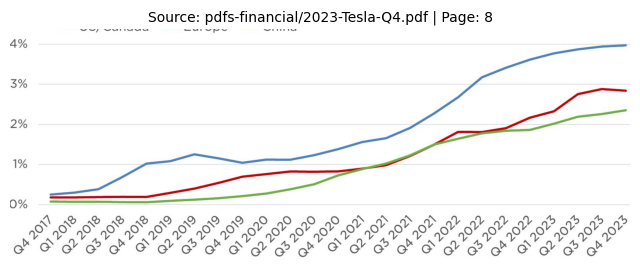

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 9
Associated Elements:

--- Titles ---
- <Title>Battery, Powertrain & Manufacturing</Title>
- <Title>Vehicle and Other Software</Title>
- <Title>In</Title>
- <Title>Artificial Intelligence Software and Hardware</Title>

--- Headers ---
- <Header>CORE TECHNOLOGY</Header>

--- Narrative_texts ---
- <NarrativeText>Cost of goods sold per vehicle declined sequentially to slightly above $36,000. Even as we approach the natural limit of cost down of our existing vehicle lineup, our team continues to focus on further cost reductions across all points of production, from raw materials to final delivery.</NarrativeText>
- <NarrativeText>We delivered the Cybertruck with an all-new user interface and new communication bus, Etherloop, that efficiently moves data while significantly reducing wiring. As part of our holiday update, when parking, Tesla vehicles without ultrasonic sensors display a high-fidelity 3D rendering of the vehicle’s

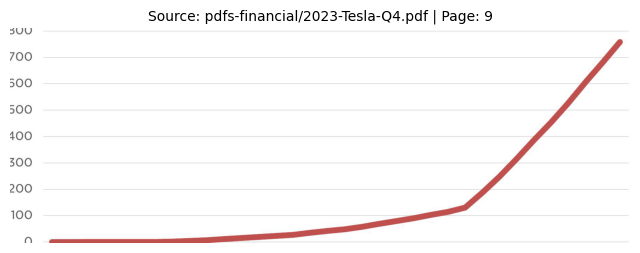

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 9
Associated Elements:

--- Titles ---
- <Title>ee</Title>
- <Title>Battery, Powertrain & Manufacturing</Title>
- <Title>Vehicle and Other Software</Title>
- <Title>In</Title>
- <Title>Artificial Intelligence Software and Hardware</Title>

--- Headers ---
- <Header>CORE TECHNOLOGY</Header>

--- Narrative_texts ---
- <NarrativeText>Cumulative miles driven with FSD Beta (millions)</NarrativeText>
- <NarrativeText>& o. ov X50 WON Oy we o SYM Oy 2 ONS SV O So Cm y Se WS ONS y¥ 9% & fase RIE Dh oh De ah ah oh oh Ves vp AP PPAR MP i? oP AP BP si? Sy</NarrativeText>
- <NarrativeText>Cost of goods sold per vehicle declined sequentially to slightly above $36,000. Even as we approach the natural limit of cost down of our existing vehicle lineup, our team continues to focus on further cost reductions across all points of production, from raw materials to final delivery.</NarrativeText>
- <NarrativeText>We delivered the Cybertruck with

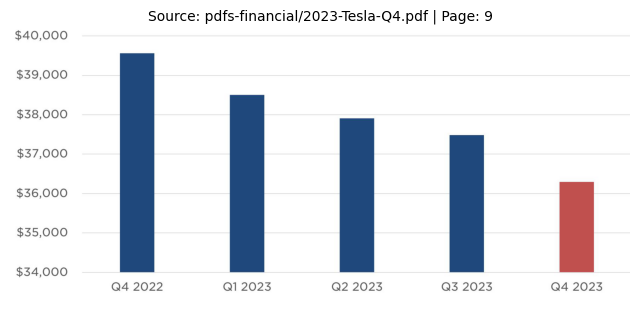

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 10
Associated Elements:

--- Titles ---
- <Title>Services and Other business</Title>
- <Title>Solar</Title>
- <Title>Energy Storage</Title>

--- Headers ---
- <Header>OTHER HIGHLIGHTS</Header>

--- Narrative_texts ---
- <NarrativeText>The Services and Other business continued to grow alongside our fleet in 2023, achieving record revenue and gross profit generation. The biggest drivers of profit generation in 2023 were part sales, used vehicle sales, merchandise sales and pay- per-use supercharging. As our fleet continues to expand in the coming years, there is an opportunity for fleet-related services to become a more meaningful driver of profit generation.</NarrativeText>
- <NarrativeText>Solar deployments declined on a sequential and YoY basis to 41 MW. Downward pressure on solar demand continued into Q4 as interest rates have remained high. Profitability in the quarter was negatively impacted by lower deployments and sea

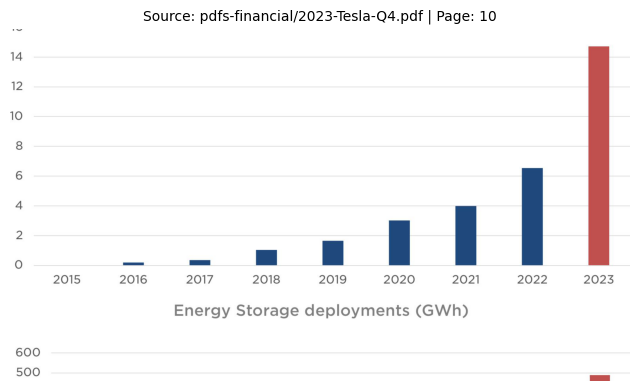

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 10
Associated Elements:

--- Titles ---
- <Title>Services and Other business</Title>
- <Title>Solar</Title>
- <Title>Energy Storage</Title>

--- Headers ---
- <Header>OTHER HIGHLIGHTS</Header>

--- Narrative_texts ---
- <NarrativeText>The Services and Other business continued to grow alongside our fleet in 2023, achieving record revenue and gross profit generation. The biggest drivers of profit generation in 2023 were part sales, used vehicle sales, merchandise sales and pay- per-use supercharging. As our fleet continues to expand in the coming years, there is an opportunity for fleet-related services to become a more meaningful driver of profit generation.</NarrativeText>
- <NarrativeText>Solar deployments declined on a sequential and YoY basis to 41 MW. Downward pressure on solar demand continued into Q4 as interest rates have remained high. Profitability in the quarter was negatively impacted by lower deployments and sea

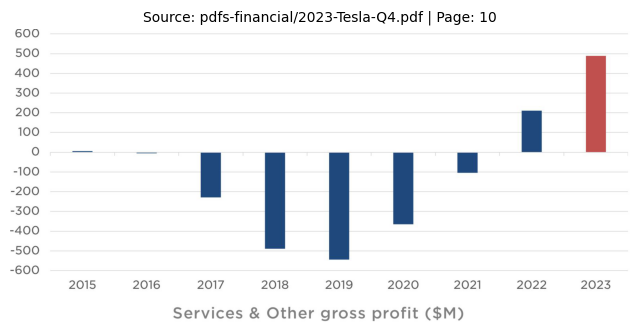

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 13
Associated Elements:

--- Titles ---
- <Title>LS</Title>

--- Headers ---
- <Header>MODEL Y - BEST-SELLING VEHICLE GLOBALLY IN 2023</Header>
---


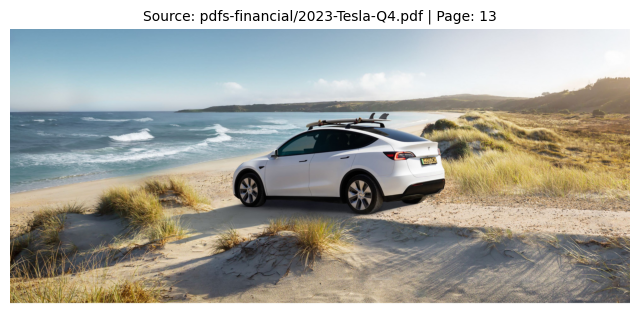

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 14
Associated Elements:

--- Headers ---
- <Header>UPDATED MODEL 3 - AVAILABLE GLOBALLY</Header>
---


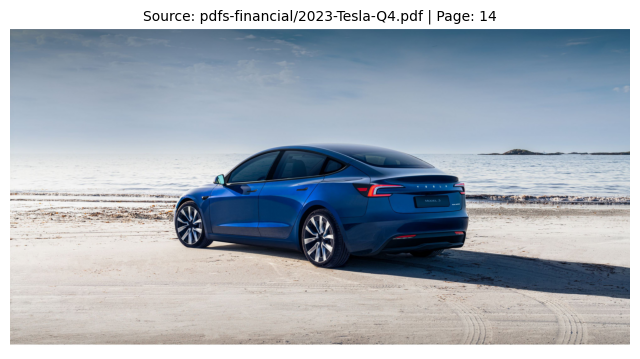

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 15
Associated Elements:

--- Headers ---
- <Header>FREMONT FACTORY</Header>
---


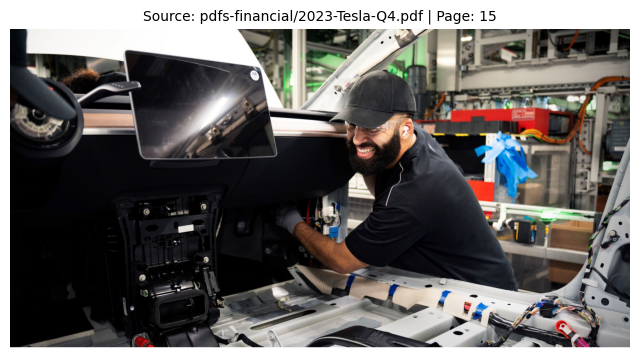

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 16
Associated Elements:

--- Headers ---
- <Header>CYBERTRUCK</Header>
---


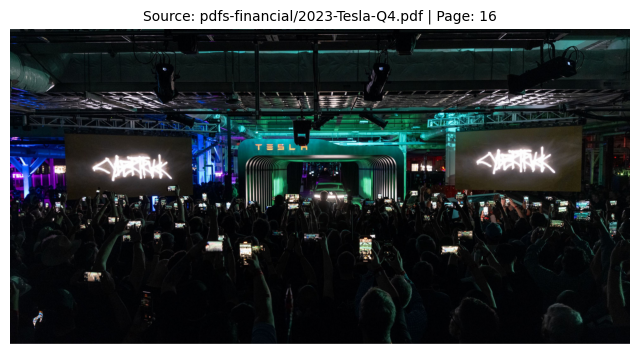

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 17
Associated Elements:

--- Headers ---
- <Header>CYBERTRUCK</Header>
---


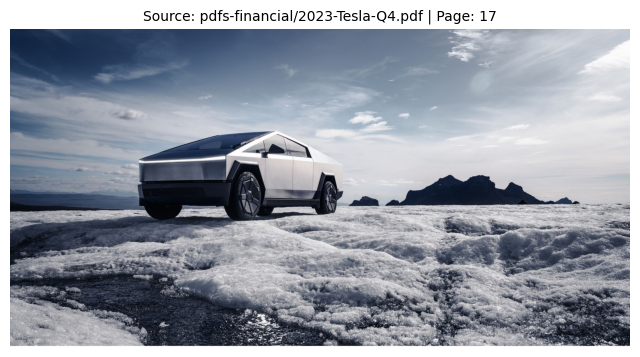

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 18
Associated Elements:

--- Headers ---
- <Header>CYBERTRUCK PRODUCTION LINE</Header>
---


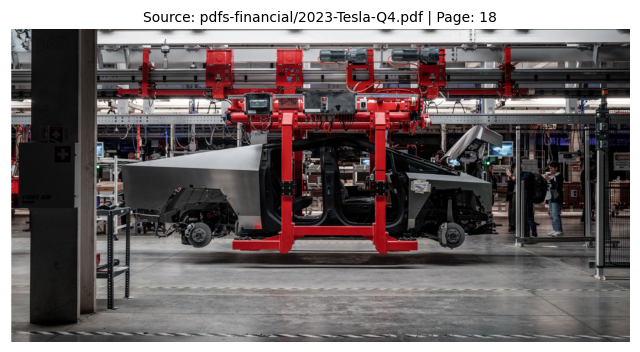

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 19
Associated Elements:

--- Headers ---
- <Header>MEGAPACK PRODUCTION LINE</Header>
---


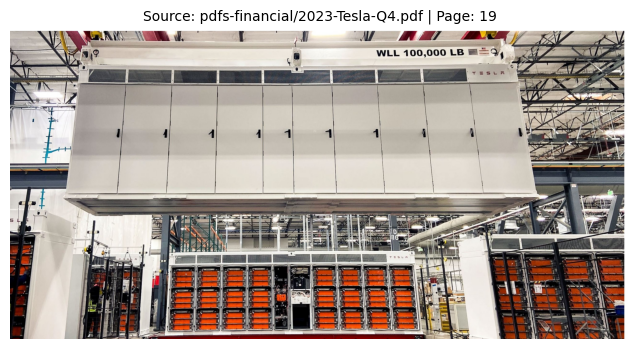

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 20
Associated Elements:

--- Headers ---
- <Header>TESLA WRAPS</Header>
---


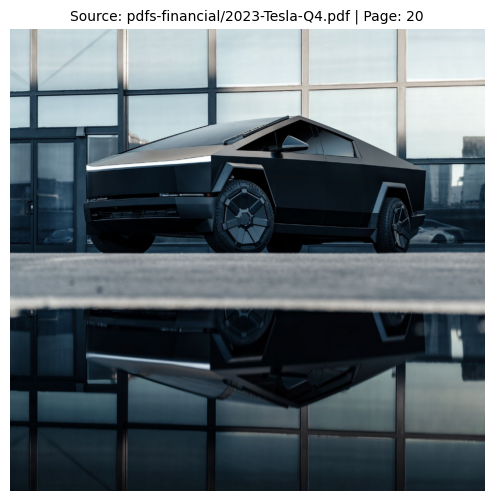

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 20
Associated Elements:

--- Headers ---
- <Header>TESLA WRAPS</Header>
---


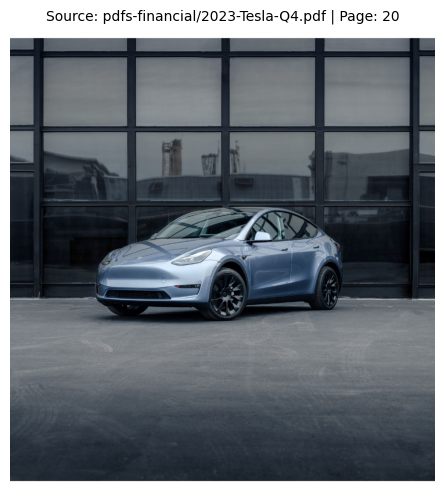

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 21
Associated Elements:

--- Headers ---
- <Header>KEY METRICS QUARTERLY (Unaudited)</Header>

--- Footers ---
- <Footer>22</Footer>
---


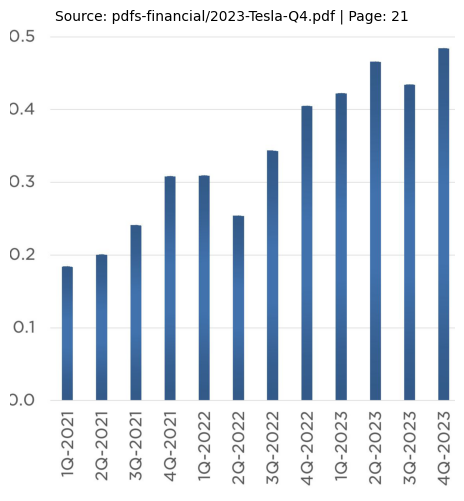

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 21
Associated Elements:

--- Headers ---
- <Header>KEY METRICS QUARTERLY (Unaudited)</Header>

--- Footers ---
- <Footer>22</Footer>

--- Captions ---
- <FigureCaption>Vehicle Deliveries (millions of units)</FigureCaption>
---


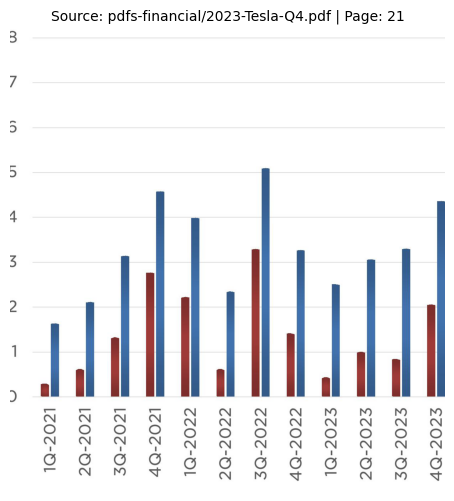

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 21
Associated Elements:

--- Headers ---
- <Header>KEY METRICS QUARTERLY (Unaudited)</Header>

--- Footers ---
- <Footer>22</Footer>

--- Captions ---
- <FigureCaption>HM Operating Cash Flow ($B) m@ Free Cash Flow ($B)</FigureCaption>
- <FigureCaption>Vehicle Deliveries (millions of units)</FigureCaption>
---


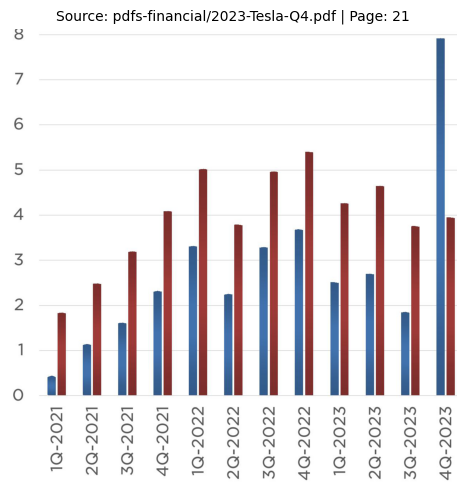

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 22
Associated Elements:

--- Headers ---
- <Header>KEY METRICS TRAILING 12 MONTHS (TTM) (Unaudited)</Header>

--- Footers ---
- <Footer>23</Footer>
---


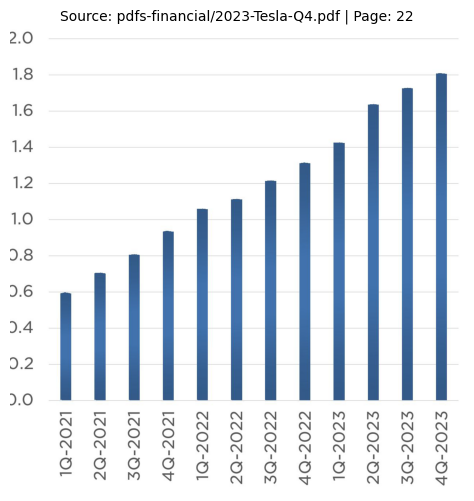

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 22
Associated Elements:

--- Titles ---
- <Title>O</Title>
- <Title>N</Title>
- <Title>SF</Title>
- <Title>Oo</Title>
- <Title>ao</Title>

--- Headers ---
- <Header>KEY METRICS TRAILING 12 MONTHS (TTM) (Unaudited)</Header>

--- Footers ---
- <Footer>23</Footer>

--- Captions ---
- <FigureCaption>Vehicle Deliveries (millions of units)</FigureCaption>

--- Texts ---
- <Text>10</Text>
- <Text>12</Text>
- <Text>14</Text>
- <Text>16</Text>
- <Text>18</Text>
- <Text>20</Text>
---


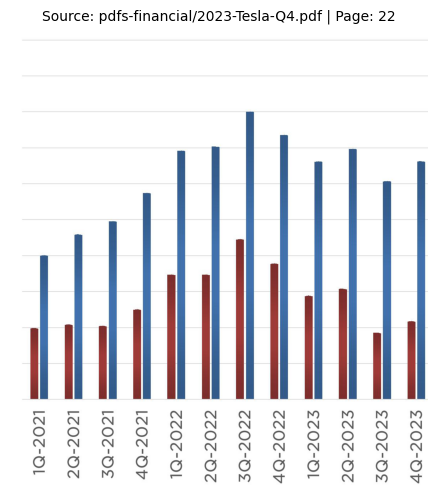

Source document: pdfs-financial/2023-Tesla-Q4.pdf
Page number: 22
Associated Elements:

--- Titles ---
- <Title>O</Title>
- <Title>N</Title>
- <Title>SF</Title>
- <Title>Oo</Title>
- <Title>ao</Title>

--- Headers ---
- <Header>KEY METRICS TRAILING 12 MONTHS (TTM) (Unaudited)</Header>

--- Footers ---
- <Footer>23</Footer>

--- Captions ---
- <FigureCaption>H Operating Cash Flow ($B) m@ Free Cash Flow ($B)</FigureCaption>
- <FigureCaption>Vehicle Deliveries (millions of units)</FigureCaption>

--- Texts ---
- <Text>10</Text>
- <Text>12</Text>
- <Text>14</Text>
- <Text>16</Text>
- <Text>18</Text>
- <Text>20</Text>
---


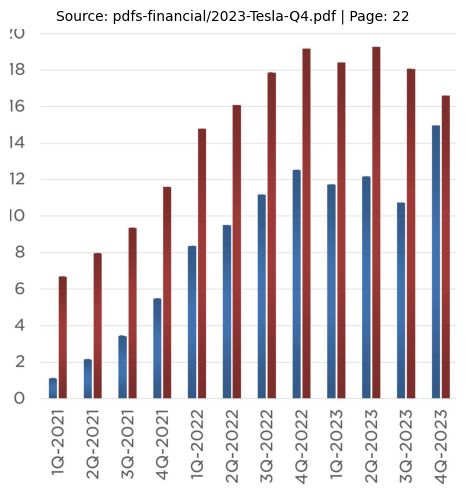

Total Image elements:  37


In [5]:
def extract_image_metadata_with_all_associated_elements(all_extracted_raw_data, all_extracted_file_paths):
    images_data = []

    # Loop through all the raw data and file paths
    for fin_report, source_document in zip(all_extracted_raw_data, all_extracted_file_paths):
        for i, element in enumerate(fin_report):
            if "Image" in str(type(element)):
                page_number = element.metadata.page_number if hasattr(element.metadata, 'page_number') else None
                image_path = element.metadata.image_path if hasattr(element.metadata, 'image_path') else None

                if image_path and os.path.exists(image_path):
                    # Debugging output to verify image metadata
                    # print(f"Processing Image - Document: {source_document}, Page: {page_number}, Path: {image_path}")
                    
                    # Store all elements on the same page before the image, separated by type
                    associated_elements = {
                        "titles": [],
                        "headers": [],
                        "footers": [],
                        "paragraphs": [],
                        "captions": [],
                        "lists": [],
                        "narrative_texts": [],
                        "formulas": [],
                        "tables": [],
                        "texts": []
                    }

                    # Traverse backward to find all associated elements before the image
                    for prev_element in reversed(fin_report[:i]):
                        prev_page_number = prev_element.metadata.page_number if hasattr(prev_element.metadata, 'page_number') else None

                        # Ensure the previous element is on the same page
                        if prev_page_number != page_number:
                            break  # Stop if the previous element is from a different page

                        # Categorize elements based on their type
                        if "Title" in str(type(prev_element)):
                            associated_elements["titles"].append(f"<Title>{str(prev_element)}</Title>")
                        elif "Header" in str(type(prev_element)):
                            associated_elements["headers"].append(f"<Header>{str(prev_element)}</Header>")
                        elif "Footer" in str(type(prev_element)):
                            associated_elements["footers"].append(f"<Footer>{str(prev_element)}</Footer>")
                        elif "FigureCaption" in str(type(prev_element)):
                            associated_elements["captions"].append(f"<FigureCaption>{str(prev_element)}</FigureCaption>")
                        elif "ListItem" in str(type(prev_element)):
                            associated_elements["lists"].append(f"<ListItem>{str(prev_element)}</ListItem>")
                        elif "NarrativeText" in str(type(prev_element)):
                            associated_elements["narrative_texts"].append(f"<NarrativeText>{str(prev_element)}</NarrativeText>")
                        elif "Formula" in str(type(prev_element)):
                            associated_elements["formulas"].append(f"<Formula>{str(prev_element)}</Formula>")
                        elif "Table" in str(type(prev_element)):
                            associated_elements["tables"].append(f"<Table>{str(prev_element)}</Table>")
                        elif "Text" in str(type(prev_element)):
                            associated_elements["texts"].append(f"<Text>{str(prev_element)}</Text>")

                    # Append the image data along with associated elements
                    images_data.append({
                        "source_document": source_document,
                        "page_number": page_number,
                        "image_path": image_path,
                        "associated_elements": associated_elements
                    })

    return images_data


# Function to visualize images with their associated elements
def visualize_image_with_associated_elements(images_data):
    for image_data in images_data:
        image_path = image_data['image_path']
        associated_elements = image_data['associated_elements']

        if image_path and os.path.exists(image_path):
            # Load and display the image
            img = mpimg.imread(image_path)
            plt.figure(figsize=(8, 6))
            plt.imshow(img)
            plt.axis('off')  # Turn off axis

            # Display the source document and page number
            plt.title(f"Source: {image_data['source_document']} | Page: {image_data['page_number']}", fontsize=10)

            # Print the associated elements by type
            print(f"Source document: {image_data['source_document']}")
            print(f"Page number: {image_data['page_number']}")
            print("Associated Elements:")
            for element_type, elements in associated_elements.items():
                if elements:
                    print(f"\n--- {element_type.capitalize()} ---")
                    for element in elements:
                        print(f"- {element}")

            print("---")

            # Show the image
            plt.show()

# Call the functions
extracted_image_data_with_elements = extract_image_metadata_with_all_associated_elements(all_extracted_raw_data, all_extracted_file_paths)
extracted_image_data = extracted_image_data_with_elements

# Visualize images with their associated elements
visualize_image_with_associated_elements(extracted_image_data_with_elements)
print("Total Image elements: ", len(extracted_image_data_with_elements))


In [6]:
# Function to extract image metadata using the raw data and file paths
def extract_image_metadata(all_raw_data, all_file_paths):
    image_data = []
    
    # Loop through the raw data and their corresponding file paths
    for esg_report, source_document in zip(all_raw_data, all_file_paths):
        for element in esg_report:
            if isinstance(element, Image):
                page_number = element.metadata.page_number
                image_path = element.metadata.image_path if hasattr(element.metadata, 'image_path') else None
                
                image_data.append({
                    "source_document": source_document,
                    "page_number": page_number,
                    "image_path": image_path
                })
    
    return image_data

# Extract image metadata using the raw data and file paths
extracted_image_data_vis = extract_image_metadata(all_extracted_raw_data, all_extracted_file_paths)



## Visualize  - Extracted Images

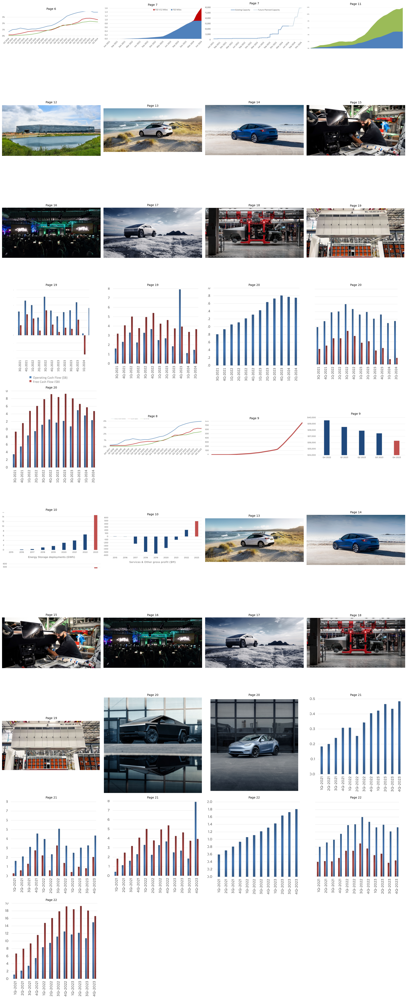

In [7]:
def display_images_from_metadata(extracted_image_data, images_per_row=4):
    valid_images = [img for img in extracted_image_data if img['image_path']]
    if not valid_images:
        print("No valid image data available.")
        return
    num_images = len(valid_images)
    num_rows = math.ceil(num_images / images_per_row)
    
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(20, 5*num_rows))
    axes = axes.flatten() if num_rows > 1 else [axes]
    for ax, img_data in zip(axes, valid_images):

        try:
            img = PIL.Image.open(img_data['image_path'])
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f"Page {img_data['page_number']}", fontsize=10)
        except Exception as e:
            print(f"Error loading image {img_data['image_path']}: {str(e)}")
            ax.text(0.5, 0.5, f"Error loading image\n{str(e)}", ha='center', va='center')
            ax.axis('off')
    for ax in axes[num_images:]:
        fig.delaxes(ax)
    plt.tight_layout()
    plt.show()
    
display_images_from_metadata(extracted_image_data_vis)

### Narrative Text Extraction

In [8]:
def extract_text_with_metadata_from_directory(all_raw_data, all_file_paths):
    text_data = []

    # Loop through the raw data and their corresponding file paths
    for fin_report, source_document in zip(all_raw_data, all_file_paths):
        paragraph_counters = {}
        text_accumulator = ""
        current_page = None

        # Loop through each element in the raw data of the current PDF
        for element in fin_report:
            if isinstance(element, NarrativeText):
                page_number = element.metadata.page_number
                text_content = element.text

                if current_page is None:
                    current_page = page_number
                
                # If the element is from the same page, accumulate the text
                if page_number == current_page:
                    text_accumulator += text_content + " "
                else:
                    # If a new page starts, store the accumulated text for the previous page
                    store_combined_text(text_accumulator, current_page, source_document, paragraph_counters, text_data)
                    
                    # Reset for the new page
                    current_page = page_number
                    text_accumulator = text_content + " "
        
        # Process the last page's accumulated text
        if text_accumulator:
            store_combined_text(text_accumulator, current_page, source_document, paragraph_counters, text_data)
    
    return text_data

def store_combined_text(text_accumulator, page_number, source_document, paragraph_counters, text_data):
    # Clean and split the accumulated text into words
    words = text_accumulator.strip().split()

    # Only add the text if it has 5 or more words
    if len(words) >= 10:
        # Track the paragraph number per page
        if page_number not in paragraph_counters:
            paragraph_counters[page_number] = 1
        else:
            paragraph_counters[page_number] += 1

        paragraph_number = paragraph_counters[page_number]

        # Add the combined text as a single entry for the page with metadata
        text_data.append({
            "source_document": source_document,
            "page_number": page_number,
            "paragraph_number": paragraph_number,
            "text": text_accumulator.strip()  # Combine all text for the page
        })

# Example usage:
extracted_text_data = extract_text_with_metadata_from_directory(all_extracted_raw_data, all_extracted_file_paths)

print("Total text elements: ", len(extracted_text_data))
extracted_text_data


Total text elements:  67


[{'source_document': 'pdfs-financial/Tesla-2024.pdf',
  'page_number': 2,
  'paragraph_number': 1,
  'text': '$1.6B GAAP operating income in Q2 after restructuring and other charges of $0.6B S$1.5B GAAP net income in Q2 S$1.8B non-GAAP net income? in Q2 In Q2, we achieved record quarterly revenues despite a difficult operating environment. The Energy Storage business continues to grow rapidly, setting a record in Q2 with 9.4 GWh of deployments, resulting in record revenues and gross profits for the overall segment. We also Saw a sequential rebound in vehicle deliveries in Q2 as overall consumer sentiment improved and we launched attractive financing options to offset the impact of sustained high interest rates. We recognized record regulatory credit revenues in Q2 as other OEMs are still behind on meeting emissions requirements. Global EV penetration returned to growth in Q2 and is taking share from ICE vehicles. We believe that a pure EV is the optimal vehicle design and will ultimate

##  Summarise table and images using LLM 

In [9]:
table_summarizer_prompt = """
As a financial data analyst, provide a concise and precise 
summary of the table contents.
Make sure you create summary for every table without fail based on whatever content from the table.
Avoid assuming company names on your own unless specified within the table.
Table: {table_content}.
"""

In [10]:
markdown_table_prompt = """
As a financial data analyst, format the given table content in a neat markdown table:
Table: {table_content}.
"""


In [11]:
images_summarizer_prompt = """
As a financial analyst focused on provide a concise and precise description of the image. 
Emphasize any key financial metrics or trends visible in the visual (e.g., chart, infographic, or graph) and their relevance to 
the company's performance. Describe the type of visual and its key elements, highlighting any significant data points or patterns 
that could impact financial analysis or investment strategies. Avoid bullet points; instead, deliver a coherent, fact-based summary 
that accurately captures the image's core insights. Avoid assuming company names on your own unless specified within the image.
Image: {image_element}
Metadata: {image_metadata}

Ensure for every image you create a description.
If some generic images are provided apart from finance, just discuss what you infer in the image without hesitation.
"
"""

In [12]:
gemini_flash = ChatGoogleGenerativeAI(
        model="gemini-1.5-flash",
        temperature = 0.1,
        max_tokens = 2048,
        timeout = None,
        max_retries = 10,
)
  
print(gemini_flash)

model='models/gemini-1.5-flash' temperature=0.1 max_retries=10 client=<google.ai.generativelanguage_v1beta.services.generative_service.client.GenerativeServiceClient object at 0x71251db22f20> async_client=<google.ai.generativelanguage_v1beta.services.generative_service.async_client.GenerativeServiceAsyncClient object at 0x71257411e980> default_metadata=()


In [13]:
def extract_table_metadata_with_summary_from_directory(all_raw_data, all_file_paths, table_summarizer_prompt):
    table_data = []
    prompt = ChatPromptTemplate.from_template(table_summarizer_prompt)

    # Calculate the total number of elements across all files
    total_elements = sum(len(fin_report) for fin_report in all_raw_data)

    # Use a single progress bar for processing all elements
    with tqdm(total=total_elements, desc="Processing Elements in All Reports") as pbar:
        # Loop through the raw data and their corresponding file paths
        for fin_report, source_document in zip(all_raw_data, all_file_paths):
            for i, element in enumerate(fin_report):
                if isinstance(element, Table):
                    page_number = element.metadata.page_number
                    table_content = str(element)

                    # Variables to store headers and titles found before the table
                    headers_and_titles = []

                    # Traverse backward to find all titles and headers before the table
                    for prev_element in reversed(fin_report[:i]):
                        if prev_element.metadata.page_number != page_number:
                            break  # Stop if the previous element is from a different page

                        # If the previous element is a Title or Header, capture it
                        if isinstance(prev_element, Title) or isinstance(prev_element, Header):
                            headers_and_titles.append(str(prev_element))
                        else:
                            # Break if we encounter something other than a Title or Header before the table
                            break

                    # Reverse the headers_and_titles list to maintain the order as in the document
                    headers_and_titles.reverse()

                    # Combine the source_document, headers, titles, and table content with tags
                    formatted_content = (
                        f"filename- {source_document}\n"
                        f"Header/Title - {' '.join(headers_and_titles)}\n"
                        f"{table_content}"
                    )

                    markdown_prompt = ChatPromptTemplate.from_template(markdown_table_prompt)
                    markdown_messages = markdown_prompt.format_messages(table_content = table_content)
                    formatted_table = gemini_flash.invoke(markdown_messages).content

                    # Generate summary using the Gemini Model
                    messages = prompt.format_messages(table_content=table_content)
                    description = gemini_flash.invoke(messages).content
                    time.sleep(4)  # Delay to avoid rate-limiting

                    # Append the combined content and description to the table data
                    table_data.append({
                        "source_document": source_document,
                        "page_number": page_number,
                        "table_content": formatted_table,  # Store source document + headers + titles + table content
                        "description": description  # Add table summary/description from Gemini model
                    })

                # Update the progress bar after each element
                pbar.update(1)

    return table_data


In [16]:
%%time
extracted_table_data_with_summary = []
extracted_table_data_with_summary = extract_table_metadata_with_summary_from_directory(
                                                            all_extracted_raw_data, all_extracted_file_paths, table_summarizer_prompt)

Processing Elements in All Reports: 100%|███████████████████████| 1339/1339 [16:14<00:00,  1.37it/s]

CPU times: user 4.05 s, sys: 1.15 s, total: 5.2 s
Wall time: 16min 14s


In [17]:
print(f"Total Table Elements: ", len(extracted_table_data_with_summary))

Total Table Elements:  100


In [18]:
for table in extracted_table_data_with_summary:
    print(f"Table in Page: {table['page_number']}")
    print(f"Table source:  {table['source_document']}")
    print(f"Table content: {table['table_content']}")
    print(f"Description:   {table['description']}")
    print("----------------------------------------")

Table in Page: 1
Table source:  pdfs-financial/Tesla-2024.pdf
Table content: ## Financial Summary Highlights

| Category | Content |
|---|---|
| Highlights | 03 or ole |
| Financial Summary | OF 08 |
| Operational Summary | 09 |
| Vehicle Capacity | 10 |
| Core Technology | mt |
| Other Highlights | 20 |
| Outlook | Ie |
| Photos & Charts | 28 |
| Key Metrics |  |
| Financial Statements |  |
| Additional Information |  | 

Description:   Please provide the actual tables you would like me to summarize. I need the content of the tables to create concise and precise summaries. The provided text "Highlights Financial Summary Operational Summary Vehicle Capacity Core Technology Other Highlights Outlook Photos & Charts Key Metrics Financial Statements Additional Information 03 or ole OF 08 09 10 mt 20 Ie 28" does not contain any table data. 

Once you provide the tables, I can help you with the summaries. 

----------------------------------------
Table in Page: 3
Table source:  pdfs-financi

In [19]:
%%time

def extract_image_metadata_with_summary_from_directory(all_extracted_raw_data, all_extracted_file_paths, images_summarizer_prompt):
    images_data = []
    prompt = ChatPromptTemplate.from_template(images_summarizer_prompt)
    
    # Count total images to process across all files
    total_images = sum(1 for fin_report in all_extracted_raw_data for element in fin_report if "Image" in str(type(element)))
    processed_count = 0
    
    # Loop through all the raw data and file paths
    for fin_report, source_document in zip(all_extracted_raw_data, all_extracted_file_paths):
        for i, element in enumerate(fin_report):
            if "Image" in str(type(element)):
                page_number = element.metadata.page_number if hasattr(element.metadata, 'page_number') else None
                image_path = element.metadata.image_path if hasattr(element.metadata, 'image_path') else None    

                if image_path and os.path.exists(image_path):
                    # Variables to store associated elements (title, header, footer, figure caption, text, list item, narrative text)
                    image_metadata = {
                        "title": None,
                        "header": None,
                        "footer": None,
                        "figure_caption": None,
                        "text": None,
                        "list_items": [],
                        "narrative_text": None
                    }

                    # Traverse backward to find all associated elements before the image
                    for prev_element in reversed(fin_report[:i]):
                        if prev_element.metadata.page_number != page_number:
                            break  # Stop if the previous element is from a different page

                        # Capture Title, Header, Footer, FigureCaption, Text, ListItem, and NarrativeText before the image
                        if isinstance(prev_element, Title):
                            image_metadata["title"] = str(prev_element)
                        elif isinstance(prev_element, Header):
                            image_metadata["header"] = str(prev_element)
                        elif isinstance(prev_element, Footer):
                            image_metadata["footer"] = str(prev_element)
                        elif "caption" in str(type(prev_element)).lower():
                            image_metadata["figure_caption"] = str(prev_element)
                        elif isinstance(prev_element, Text):
                            image_metadata["text"] = str(prev_element)
                        elif isinstance(prev_element, ListItem):
                            image_metadata["list_items"].append(str(prev_element))
                        elif isinstance(prev_element, NarrativeText):
                            # Capture the last 256 characters of NarrativeText
                            image_metadata["narrative_text"] = str(prev_element)[-256:]

                    # Combine the metadata into a single text prompt
                    metadata_prompt = ""
                    if image_metadata["title"]:
                        metadata_prompt += f"Title: {image_metadata['title']}. "
                    if image_metadata["header"]:
                        metadata_prompt += f"Header: {image_metadata['header']}. "
                    if image_metadata["footer"]:
                        metadata_prompt += f"Footer: {image_metadata['footer']}. "
                    if image_metadata["figure_caption"]:
                        metadata_prompt += f"Figure Caption: {image_metadata['figure_caption']}. "
                    if image_metadata["text"]:
                        metadata_prompt += f"Text: {image_metadata['text']}. "
                    if image_metadata["list_items"]:
                        metadata_prompt += f"List Items: {'; '.join(image_metadata['list_items'])}. "
                    if image_metadata["narrative_text"]:
                        metadata_prompt += f"Narrative Text: {image_metadata['narrative_text']}. "

                    # Prepare the summarizer prompt by combining the image path and the metadata
                    messages = prompt.format_messages(image_element=image_path, image_metadata=metadata_prompt)
                    
                    # Delay to avoid hitting Gemini API rate limits/min
                    time.sleep(10)
                    
                    # Get the description
                    description = gemini_flash.invoke(messages).content

                    # Encode the image in base64
                    with open(image_path, 'rb') as image_file:
                        encoded_string = base64.b64encode(image_file.read()).decode('utf-8')

                    # Store the metadata, base64 image, and summary
                    images_data.append({
                        "source_document": source_document,
                        "page_number": page_number,
                        "image_path": image_path,
                        "description": description,
                        "base64_encoding": encoded_string,
                        "metadata": image_metadata
                    })
                    
                    # Update and print the processed count
                    processed_count += 1
                    # Clear previous print and show the updated progress in the same line
                    sys.stdout.write(f"\rProcessed {processed_count} out of {total_images} images.")
                    sys.stdout.flush()

                else:
                    print(f"\nWarning: Image file not found or path not available for image on page {page_number}")
    
    return images_data
                    

CPU times: user 5 μs, sys: 1e+03 ns, total: 6 μs
Wall time: 8.82 μs


In [20]:
extracted_image_data_with_summary = []
extracted_image_data_with_summary = extract_image_metadata_with_summary_from_directory(
    all_extracted_raw_data, all_extracted_file_paths, images_summarizer_prompt
)

Processed 37 out of 37 images.

In [21]:
for image in extracted_image_data_with_summary:
    print(f"Image on Page {image['page_number']}:")
    print(f"Path: {image['image_path']}")
    print(f"Description: {image['description']}")
    # print(f"Base 64: {image['base64_encoding']}") #To avoid IPub rate limit exceeded warning
    
    print("---")

Image on Page 6:
Path: data/images/figure-6-1.jpg
Description: The image presents a bar chart depicting the "Vehicle Capacity" for the US states of California, Nevada, and Texas.  While specific company names are not mentioned, the text accompanying the chart indicates a focus on vehicle production and expansion, likely referencing an automotive manufacturer. The chart reveals a significant disparity in vehicle capacity across the three states, with California exhibiting the highest capacity, followed by Texas and then Nevada. This suggests a strategic focus on California as a key production hub, potentially due to factors like market demand, infrastructure, or cost considerations. The text further highlights a sequential decline in production during Q2, followed by an anticipated increase in Q3. This information is crucial for financial analysts as it indicates potential fluctuations in production output and associated revenue streams.  The chart's data, combined with the textual cont

## Weaviate

In [22]:
studio_key = "Your-Google-Studio-Key"
weaviate_key = "Weaviate-API-Key"

weaviate_url = "Get ur Cluster Url"

In [23]:
client = weaviate.connect_to_weaviate_cloud(
    cluster_url = weaviate_url,
    auth_credentials = Auth.api_key(weaviate_key),
    skip_init_checks=True,
    headers = {
    "X-Google-Studio-Api-Key": studio_key,
}
)
# client.close()
print("Connected?: ",client.is_connected())

Connected?:  True


In [24]:
client.collections.delete("RAGFinancialDocs")

properties = [
    wc.Property(name="source_document", data_type=wc.DataType.TEXT, skip_vectorization=True),
    wc.Property(name="page_number", data_type=wc.DataType.INT, skip_vectorization=True),
    wc.Property(name="paragraph_number", data_type=wc.DataType.INT, skip_vectorization=True),
    wc.Property(name="text", data_type=wc.DataType.TEXT), #default: skip_vectorization = False
    wc.Property(name="image_path", data_type=wc.DataType.TEXT, skip_vectorization=True),
    wc.Property(name="description", data_type=wc.DataType.TEXT),
    wc.Property(name="base64_encoding", data_type=wc.DataType.BLOB, skip_vectorization=True),
    wc.Property(name="table_content", data_type=wc.DataType.TEXT),
    wc.Property(name="content_type", data_type=wc.DataType.TEXT, skip_vectorization=True),
]

if not client.collections.exists("RAGFinancialDocs"):
    client.collections.create(
        name = "RAGFinancialDocs",
        properties = properties,
        vectorizer_config = None
    )

In [25]:
client.collections.list_all()

{'RAGFinancialDocs': _CollectionConfigSimple(name='RAGFinancialDocs', description=None, generative_config=None, properties=[_Property(name='source_document', description=None, data_type=<DataType.TEXT: 'text'>, index_filterable=True, index_range_filters=False, index_searchable=True, nested_properties=None, tokenization=<Tokenization.WORD: 'word'>, vectorizer_config=None, vectorizer='none'), _Property(name='page_number', description=None, data_type=<DataType.INT: 'int'>, index_filterable=True, index_range_filters=False, index_searchable=False, nested_properties=None, tokenization=None, vectorizer_config=None, vectorizer='none'), _Property(name='paragraph_number', description=None, data_type=<DataType.INT: 'int'>, index_filterable=True, index_range_filters=False, index_searchable=False, nested_properties=None, tokenization=None, vectorizer_config=None, vectorizer='none'), _Property(name='text', description=None, data_type=<DataType.TEXT: 'text'>, index_filterable=True, index_range_filter

### `text-embedding-004` Embedding model from Google AI Studio

In [26]:
# Call Gemini with genai library
#Vertex AI text embeddings API uses dense vector representations: text-embedding-004, for example, uses 768-dimensional vectors. Dense vector embedding models use deep-learning methods similar to the ones used by large language models. Unlike sparse vectors, which tend to directly map words to numbers, dense vectors are designed to better represent the meaning of a piece of text. The benefit of using dense vector embeddings in generative AI is that instead of searching for direct word or syntax matches, you can better search for passages that align to the meaning of the query, even if the passages don't use the same language.

genai.configure(api_key = os.environ["GOOGLE_API_KEY"] )

def get_embedding(text):
    result = genai.embed_content(
                        model="models/text-embedding-004",
                        task_type = "retrieval_document",
                        content = text,
                        # output_dimensionality = 768
                        
                       )
    
    return result['embedding']

#### Start Ingesting in Weaviate collection...

In [27]:
def ingest_text_data(collection, text_data):
    with collection.batch.dynamic() as batch:
        for text in tqdm(text_data, desc="Ingesting text data"):
            vector = get_embedding(text['text'])
            text_obj = {
                "source_document": text['source_document'],
                "page_number": text['page_number'],
                "paragraph_number": text['paragraph_number'],
                "text": text['text'],
                "content_type": "text"
            }
            batch.add_object(
                properties = text_obj,
                uuid = generate_uuid5(f"{text['source_document']}_{text['page_number']}_{text['paragraph_number']}"),
                vector = vector
            )  

In [28]:
def ingest_image_data(collection, image_data):
    
    with collection.batch.dynamic() as batch:
        for image in tqdm(image_data, desc="Ingesting image data"):
            
            vector = get_embedding(image['description'])
            
            image_obj = {
                "source_document": image['source_document'],
                "page_number": image['page_number'],
                "image_path": image['image_path'],
                "description": image['description'],
                "base64_encoding": image['base64_encoding'],
                "content_type": "image"
            }
            
            batch.add_object(
                properties =  image_obj,
            uuid = generate_uuid5(f"{image['source_document']}_{image['page_number']}_{image['image_path']}"),
            vector = vector
            )
    

In [29]:
def ingest_table_data(collection, table_data):
    with collection.batch.dynamic() as batch:
        for table in tqdm(table_data, desc="Ingesting table data"):
          
            vector = get_embedding(table['description'])
            
            table_obj = {
                "source_document": table['source_document'],
                "page_number": table['page_number'],
                "table_content": table['table_content'],
                "description": table['description'],
                "content_type": "table"
            }
            batch.add_object(
                properties =  table_obj,
                uuid = generate_uuid5(f"{table['source_document']}_{table['page_number']}"),
                vector = vector
            )

It will take sometime to reflect in the weaviate dashboard. Refresh multiple times with few secs interval

In [30]:
def ingest_all_data(collection_name, text_data, image_data ,table_data):
    
    collection = client.collections.get(collection_name)
    ingest_text_data(collection, text_data)
    ingest_image_data(collection, image_data)
    ingest_table_data(collection, table_data)

    if len(collection.batch.failed_objects) > 0:
        print(f"Failed to import {len(collection.batch.failed_objects)} objects")
    else:
        print("All objects imported successfully")


ingest_all_data(
    collection_name = "RAGFinancialDocs",
    text_data = extracted_text_data, # Save text
    image_data = extracted_image_data_with_summary, #Save image with summary 
    table_data = extracted_table_data_with_summary    #Need to save table with summary
)
    

Ingesting table data: 100%|███████████████████████████████████████| 100/100 [00:55<00:00,  1.81it/s]


All objects imported successfully


### Perform Sanity Check

In [31]:
collection = client.collections.get("RAGFinancialDocs")

for item in collection.iterator():
    print(item.uuid, item.properties)

04eaa8c5-fcdc-55f6-adb5-84265c2c5426 {'text': None, 'description': 'I do not have access to the internet or any local files, including images. Therefore, I cannot provide a description of the image "data/images/figure-15-8.jpg" or analyze its financial implications. \n\nPlease provide me with the image itself or a detailed description of its contents, including any relevant financial data or charts. I will then be able to analyze the image and provide you with a concise and precise description, focusing on key financial metrics and trends. \n', 'image_path': 'data/images/figure-15-8.jpg', 'page_number': 15, 'table_content': None, 'paragraph_number': None, 'source_document': 'pdfs-financial/Tesla-2024.pdf', 'content_type': 'image'}
06606c92-d7c9-59c6-9fb8-99d87270f3e2 {'text': 'All information in this release is as of June 30, 2024. The company undertakes no duty to update any forward-looking statement to conform the statement to actual results or changes in the company’s expectations. 

# Retrieval

In [32]:
gemini_flash = ChatGoogleGenerativeAI(
        model="gemini-1.5-flash",
        temperature = 0.1,
        max_tokens = 4096,
        timeout = None,
        max_retries = 10,
)
  
print(gemini_flash)

model='models/gemini-1.5-flash' temperature=0.1 max_retries=10 client=<google.ai.generativelanguage_v1beta.services.generative_service.client.GenerativeServiceClient object at 0x71259ea0e680> async_client=<google.ai.generativelanguage_v1beta.services.generative_service.async_client.GenerativeServiceAsyncClient object at 0x712517180700> default_metadata=()


In [33]:
def search_multimodal(query: str, limit: int = 3):
    query_vector = get_embedding(query)
    
    financial_documents = client.collections.get("RAGFinancialDocs")

    response = financial_documents.query.near_vector(
        near_vector=query_vector,
        limit=limit,
        return_metadata=wq.MetadataQuery(distance=True),
        return_properties=[
            "content_type",
            "source_document", "page_number", "paragraph_number", "text",
            "image_path", "description", "table_content"
        ]
    )

    # Debugging output to verify what is being returned
    for item in response.objects:
        print(f"Retrieved item content_type: {item.properties['content_type']}")
    
    return response.objects


In [34]:
def retrieve_docs(query, limit=3):

    search_results = search_multimodal(query, limit)
    
    for item in search_results:
        if item.properties['content_type'] == 'text':
            print(f"Source: {item.properties['source_document']}, Page: {item.properties['page_number']}")
            print(f"Paragraph {item.properties['paragraph_number']}")
            print(f"Text: {item.properties['text'][:100]}...")

        elif item.properties['content_type'] == 'image':
            print(f"Source: {item.properties['source_document']}, Page: {item.properties['page_number']}")
            print(f"Description: {item.properties['description']}")

            # Decode the base64 string and display the image
            base64_image = item.properties.get('base64_encoding')
           
           
            if base64_image:
                try:
                    # Decode base64 image and open it using PIL
                    image_data = base64.b64decode(base64_image)
                    image = PIL.Image.open(io.BytesIO(image_data))

                    # Display the image using matplotlib
                    plt.figure(figsize=(8, 6))
                    plt.imshow(image)
                    plt.axis('off')  # Turn off axis
                    plt.show()
                except Exception as e:
                    print(f"Error displaying image: {e}")

        elif item.properties['content_type'] == 'table':
            print(f"Source: {item.properties['source_document']}, Page: {item.properties['page_number']}")
            print(f"Description: {item.properties['description']}")
            print(f"Table content: {item.properties['table_content']}")
        print(f"Distance to query: {item.metadata.distance:.3f}")
        print("---")

In [249]:
user_query = "Tesla Cybertruck Production line"

search_results = retrieve_docs(user_query)
# # search_multimodal(user_query)

Retrieved item content_type: image
Retrieved item content_type: table
Retrieved item content_type: text
Source: pdfs-financial/2023-Tesla-Q4.pdf, Page: 18
Description: The image depicts a production line for the Cybertruck, showcasing a series of workstations where workers assemble various components of the vehicle. While the image doesn't provide specific financial metrics, it offers a visual representation of the company's manufacturing capabilities and commitment to producing the Cybertruck. The image suggests a high level of automation and efficiency in the production process, which could potentially translate into lower production costs and higher profit margins. The presence of multiple workstations indicates a robust production capacity, potentially signaling the company's confidence in meeting anticipated demand for the Cybertruck.  The image's focus on the production line highlights the company's operational efficiency and its ability to scale production, which are crucial fac

## Multimodal RAG

In [35]:
def generate_response(query: str, context: str) -> str:

    response_template = f"""

    You are an AI Assistant.
    If you are provided with images describe the image without any hesitation of what you just infer from the pic.
    If you are provided with table, discuss quantifiable results from table data.
    Use the following pieces of information to answer the user's question.
    If you cannot answer the question based on provided information, say that you don't have enough information to answer accurately.
    Don't confubalate.

   
    Context:
    {context}
    User Question: {query}
    Please provide a detailed and accurate answer based on the given context:
    """
    prompt = ChatPromptTemplate.from_template(response_template)

    messages = prompt.format_messages(query  = query, context = context)
     
    response = gemini_flash.invoke(messages).content

    return response


In [36]:
def generate_image_response(query: str, context: str) -> str:

    response_template = f"""
    
    You are an AI Assistant.
    If you are provided with general images describe the image without any hesitation of what you just infer from the pic.
    If you are provided with bar,charts,graphs, table images just infer the image description and discuss what's provied 
    within the image. 
    Use the following pieces of information to answer the user's question.
    

   
    Context:
    {context}
    User Question: {query}
    Please provide a detailed and accurate answer based on the given context:
    """
    prompt = ChatPromptTemplate.from_template(response_template)

    messages = prompt.format_messages(query  = query, context = context)
     
    response = gemini_flash.invoke(messages).content

    return response


### Final Response

In [52]:
def fin_analysis(user_query: str):
    
    # Retrieve relevant information
    search_results = search_multimodal(user_query)

    final_output = {
        "user_query": user_query,
        "responses": []
    }

    # Loop through each retrieved item to generate a response individually
    for item in search_results:
        
        # Prepare individual context for the current item
        context = ""
        is_image = False  # Flag to check if content is an image
        
        if item.properties['content_type'] == 'text':
            context += f"""Text from {item.properties['source_document']} (Page {item.properties['page_number']},
            Paragraph {item.properties['paragraph_number']}): {item.properties['text']}\n\n"""
        
        elif item.properties['content_type'] == 'image':
            is_image = True
            context += f"""Image Description from {item.properties['source_document']} 
            (Page {item.properties['page_number']}, Path: {item.properties['image_path']}): {item.properties['description']}\n\n"""
        
        elif item.properties['content_type'] == 'table':
            context += f"""Table Description from {item.properties['source_document']} 
            Table Content: \n {item.properties['table_content']} 
            (Page {item.properties['page_number']}): {item.properties['description']}\n\n"""

        # Determine the response template to use based on content type
        if is_image:
            response = generate_image_response(user_query, context)  # Different function for images
        else:
            response = generate_response(user_query, context)  # Default response for text and table

        # Format response and add sources for each individual query
        response_data = {
            "context": context,
            "ai_response": response,
            "source": {
                "type": item.properties["content_type"],
                "distance": item.metadata.distance,
                "document": item.properties["source_document"],
                "page": item.properties["page_number"]
            }
        }
        # If text, add paragraph information
        if item.properties['content_type'] == 'text':
            response_data["source"]["paragraph"] = item.properties["paragraph_number"]
        # If image, add image path information
        elif item.properties['content_type'] == 'image':
            response_data["source"]["image_path"] = item.properties["image_path"]

        # Append each individual response and source to final_output
        final_output["responses"].append(response_data)

    return final_output


In [53]:
def wrap_text(text, width = 120):
    
    wrapped_text = textwrap.fill(text, width = width)
    return wrapped_text

In [56]:
def format_answer(user_question):
    
    response_data = fin_analysis(user_question)
    
    
    # Loop through each response in the 'responses' list
    for response in response_data['responses']:
        print("Gemini Response: ", response['ai_response'])
        source = response['source']
        
        print("\nSource:")
        print(f"- Type: {source['type']}, Distance: {source['distance']:.3f}")
        print(f"  Document: {source['document']}, Page: {source['page']}")
        
        # If it's a text source, show paragraph info
        if source['type'] == 'text':
            print(f"  Paragraph: {source['paragraph']}")
        
        # If it's an image source, show the image
        elif source['type'] == 'image':
            try:
                print(f"  Image Path: {source['image_path']}")
                image = PIL.Image.open(source["image_path"])
                plt.figure(figsize=(8, 6))
                plt.imshow(image)
                plt.axis('off')
                plt.show()
            except Exception as e:
                print(f"Error displaying image: {e}")
        
        print("---")  # Separator for the next response


In [255]:
user_question = "Describe Apple Inc. Financial Liabilities and Equity"
format_answer(user_question)

Retrieved item content_type: table
Retrieved item content_type: table
Retrieved item content_type: text

--- Response 1 ---

User Query: Describe Apple Inc. Financial Liabilities and Equity

**Gemini Response:**
 I am sorry, but I do not have enough information to answer your question. The provided context is about Alphabet Inc.,
not Apple Inc.

Source:
- Type: table, Distance: 0.245
  Document: pdfs-financial/alphabet-inc.pdf, Page: 4
---

--- Response 2 ---

User Query: Describe Apple Inc. Financial Liabilities and Equity

**Gemini Response:**
 Apple Inc.'s total liabilities and shareholders' equity decreased slightly from $353,514 million in 2022 to $352,583
million in 2023.  This decrease is primarily driven by a decline in shareholders' equity, which fell from $74,100
million to $62,146 million. This decline in shareholders' equity is attributed to a significant decrease in retained
earnings and an increase in accumulated other comprehensive loss.

Source:
- Type: table, Distance:

In [256]:
user_question = "Describe Alphabet's Financial Liabilities and Equity"
format_answer(user_question)

Retrieved item content_type: text
Retrieved item content_type: table
Retrieved item content_type: text

--- Response 1 ---

User Query: Describe Alphabet's Financial Liabilities and Equity

**Gemini Response:**
 I do not have enough information to answer accurately. The provided text focuses on forward-looking statements and risk
factors, not on Alphabet's financial liabilities and equity.

Source:
- Type: text, Distance: 0.233
  Document: pdfs-financial/alphabet-inc.pdf, Page: 3
  Paragraph: 1
---

--- Response 2 ---

User Query: Describe Alphabet's Financial Liabilities and Equity

**Gemini Response:**
 Alphabet's total liabilities decreased from $114,506 in the prior year to $119,013 in the current year. This increase is
primarily driven by an increase in current liabilities, particularly accrued compensation and benefits, which rose from
$9,703 to $15,140.   Alphabet's total stockholders' equity decreased from $292,844 in the prior year to $283,379 in the
current year. This decreas

Retrieved item content_type: table
Retrieved item content_type: image
Retrieved item content_type: table

--- Response 1 ---

User Query: Describe about the TESLA Production Line

**Gemini Response:**
 Tesla has production lines for various models across different locations.   * **California:** Produces Model S and Model
X with a capacity of 100,000 units. * **Shanghai:** Produces Model 3 and Model Y with a capacity of over 950,000 units.
* **Berlin:** Produces Model Y with a capacity of 375,000 units. * **Texas:** Produces Model Y with a capacity of over
250,000 units. * **Nevada:** Produces the Tesla Semi in pilot production.  The Cybertruck is also in pilot production at
the Texas facility. The Next Gen Platform and Roadster are currently in development with no confirmed production
locations or capacities.

Source:
- Type: table, Distance: 0.321
  Document: pdfs-financial/2023-Tesla-Q4.pdf, Page: 8
---

--- Response 2 ---

User Query: Describe about the TESLA Production Line

**Gemi

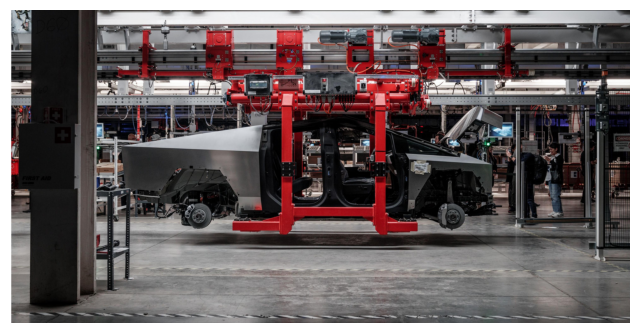

---

--- Response 3 ---

User Query: Describe about the TESLA Production Line

**Gemini Response:**
 I do not have enough information to answer your question. The provided context only includes information about Alphabet
Inc. and does not contain any details about Tesla's production line.

Source:
- Type: table, Distance: 0.338
  Document: pdfs-financial/alphabet-inc.pdf, Page: 0
---


In [261]:
user_question = "Describe about the TESLA Production Line"
format_answer(user_question)

Retrieved item content_type: image
Retrieved item content_type: table
Retrieved item content_type: table

--- Response 1 ---

User Query: Describe about the TESLA Current Installed Annual Vehicle Capacity

**Gemini Response:**
 The image shows a bar chart representing Tesla's current installed annual vehicle capacity in three US states:
California, Nevada, and Texas.    * **California** has the highest capacity, indicating a strong market presence or
potential for future growth in the state.  * **Texas** has the second highest capacity, suggesting a significant
investment in the region. * **Nevada** has the lowest capacity, potentially indicating a smaller market or less focus on
this state.  The chart highlights a significant disparity in capacity between the three states, suggesting a strategic
focus on California and Texas.   The caption mentions a record annualized run rate of nearly 2.0 million vehicles in Q4,
indicating a positive trend in production capacity. This information, c

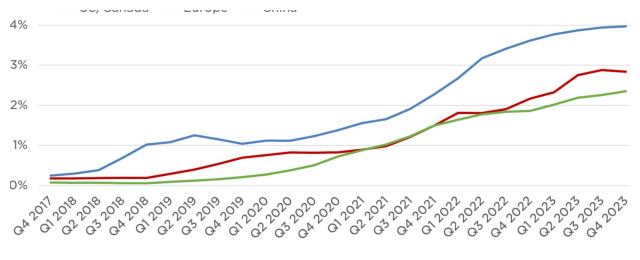

---

--- Response 2 ---

User Query: Describe about the TESLA Current Installed Annual Vehicle Capacity

**Gemini Response:**
 The provided table does not contain information on Tesla's current installed annual vehicle capacity. Therefore, I
cannot answer your question.

Source:
- Type: table, Distance: 0.248
  Document: pdfs-financial/2023-Tesla-Q4.pdf, Page: 6
---

--- Response 3 ---

User Query: Describe about the TESLA Current Installed Annual Vehicle Capacity

**Gemini Response:**
 Tesla's current installed annual vehicle capacity is estimated to be over **1,975,000** vehicles. This is based on the
following production capacities:  * **California:** 650,000 (100,000 Model S/X + 550,000 Model 3/Y) * **Shanghai:** Over
950,000 Model 3/Y * **Berlin:** 375,000 Model Y * **Texas:** Over 250,000 Model Y  This information is based on the
table provided, which shows the estimated production capacity for various Tesla vehicles across different manufacturing
locations.

Source:
- Type: tabl

In [262]:
user_question = "Describe about the TESLA Current Installed Annual Vehicle Capacity"
format_answer(user_question)

In [268]:
user_question = "Describe about the JP Morgan Chase QUARTERLY TRENDS SIX MONTHS ENDED JUNE 30, 2024"
format_answer(user_question)

Retrieved item content_type: table
Retrieved item content_type: text
Retrieved item content_type: table

--- Response 1 ---

User Query: Describe about the JP Morgan Chase QUARTERLY TRENDS SIX MONTHS ENDED JUNE 30, 2024

**Gemini Response:**
 The table "QUARTERLY TRENDS SIX MONTHS ENDED JUNE 30, 2024" from JP Morgan Chase's Q2 2024 report provides a detailed
look at credit data and quality statistics for the first half of 2024.   **Key Highlights:**  * **Net Charge-
offs/(Recoveries):**  While net charge-offs were significantly higher in Q1 2024 compared to Q1 2023, they decreased in
subsequent quarters. * **Nonperforming Assets:**     * **Nonaccrual Loans:** Total nonaccrual loans increased from Q1
2023 to Q1 2024, but decreased in subsequent quarters.     * **Derivative Receivables:** Derivative receivables remained
relatively stable throughout the period.     * **Assets Acquired in Loan Satisfactions:** These assets increased
significantly from Q1 2023 to Q1 2024, and continued to i

In [284]:
user_question = "Discuss about the Summary of Microsoft Revenue by Segment (FY2023)"
format_answer(user_question)

Retrieved item content_type: table
Retrieved item content_type: text
Retrieved item content_type: table

--- Response 1 ---

User Query: Discuss about the Summary of Microsoft Revenue by Segment (FY2023)

**Gemini Response:**
 The table "Summary of Microsoft Revenue by Segment (FY2023)" provides a breakdown of Microsoft's revenue by segment for
Fiscal Year 2023.  It highlights several key observations:  * **Cloud Services Dominate:**  Azure and other cloud
services, Dynamics products and cloud services, and Office consumer products and cloud services are the top revenue
generators, collectively accounting for over 60% of total revenue. This indicates a strong reliance on cloud-based
services for Microsoft's revenue. * **Strong Growth in Cloud:**  All cloud-related segments experienced significant
growth, with Azure and other cloud services seeing the highest increase at 30%. This demonstrates the continued success
and expansion of Microsoft's cloud offerings. * **Windows Remains Releva